# Рынок заведений общественного питания Москвы для инвесторов из фонда «Shut Up and Take My Money»

В данном проекте будет произведено исследование рынка Москвы по местам общественного питания, нахождение особенностей и презентация полученных результатов, которые в будущем помогут в выборе подходящего инвесторам места. Для анализа был предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Проект состоит из 5 пунктов:
1. Загрузка данных и изучение общей информации
2. Предобработка данных
3. Анализ данных
4. Детализация исследования: открытие кофейни
5. Презентация

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import re
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings

## Загрузка данных и изучение общей информации

In [2]:
try:
    data = pd.read_csv('/Users/artemrybalko/Study/Analytics_Yandex/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Предоставленный датасет состоит из 8406 строк и 13 столбцов.

В столбце seats тип данных является float64, однако количество посадочных мест считается в целых числах, поэтому разумно тип данных в этом столбце заменить на int. В столбце chain тип данных можно скорректировать до булева. Названия столбцов записаны корректно.

In [5]:
(data.middle_avg_bill % 1).sum()

0.0

In [6]:
(data.middle_coffee_cup % 1).sum()

0.0

Заметим, что в столбцах middle_avg_bill и middle_coffee_cup тип данных записан в виде float, однако дробной части ни для каких данных из этих столбцов нет. Нужно заменить тип данных в этих столбцах на int.

In [7]:
len(data.name.unique())

5614

Всего 8406 упоминаний о заведениях в таблице, из которых 5614 уникальных. Эти данные могут измениться после обработки датасета и удаления дубликатов.

In [8]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In [9]:
data[data['seats']==1288]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0


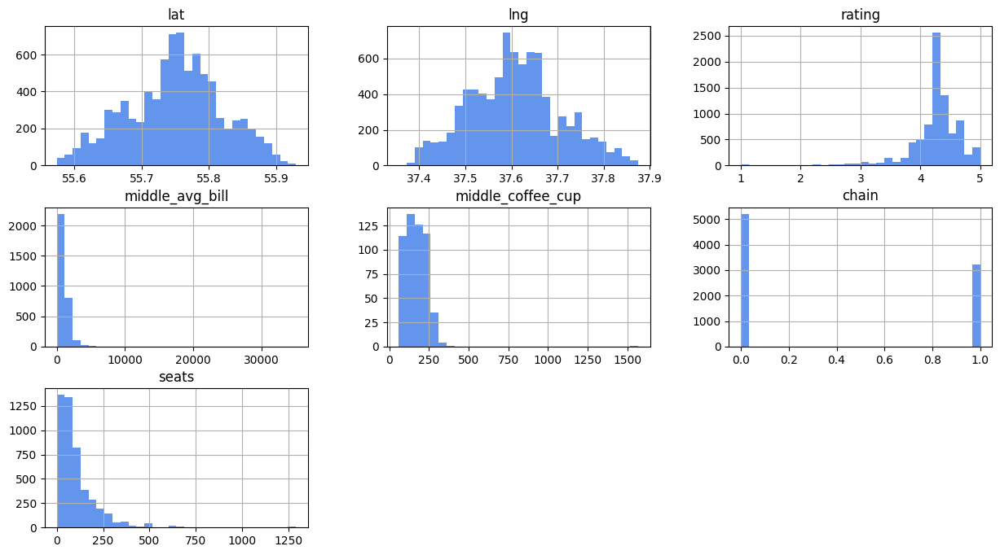

In [10]:
data.hist(bins=30, figsize=(15, 8), color='cornflowerblue');

По гистограммам некоторых столбцов наблюдаем сильно отличающиеся от среднего значения (выбросы), например в столбцах rating, middle_avg_bill, middle_coffee_cup, seats. Выбросы эти могли появиться из-за неверного введения данных, особенно на это указывают заведения с 1288 посадочными местами. В предобработке данных, скорее всего, придется удалять эти выделяющиеся значения.

In [11]:
data.category.value_counts()

category
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: count, dtype: int64

In [12]:
data.district.value_counts()

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

В столбцах category и district ошибок или опечаток в данных не обнаружено.

## Предобработка данных

### Преобразование типов данных

In [13]:
# Преобразуем типы данных столбцов seats, middle_avg_bill, middle_coffee_cup в int
# Тип данных столбца chain преобразуем в bool
data = data.astype({"seats" : "Int64", 
                    "chain" : "bool", 
                    "middle_avg_bill" : "Int64", 
                    "middle_coffee_cup" : "Int64"})

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   Int64  
 11  middle_coffee_cup  535 non-null    Int64  
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   Int64  
dtypes: Int64(3), bool(1), float64(3), object(7)
memory usage: 886.7+ KB


### Проверка на дубликаты

In [15]:
data.duplicated().sum()

0

Полных дубликатов в таблице не найдено.

In [16]:
data[['name', 'lat', 'lng']].duplicated().sum()

0

In [17]:
data[['name', 'address']].duplicated().sum()

0

Заведений с одинаковыми названиями и координатами тоже не найдено.

In [18]:
data[(data['name'].duplicated()) & (data['chain'] == 0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
47,Кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,<NA>,<NA>,False,35
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,<NA>,<NA>,False,<NA>
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,<NA>,<NA>,False,50
141,Кафе,кафе,"Москва, Дубнинская улица, 52, стр. 1",Северный административный округ,"ежедневно, 10:00–20:00",55.896020,37.556072,3.9,NaN,NaN,<NA>,<NA>,False,70
159,Кафе,кафе,"Москва, Дмитровское шоссе, 163А",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.908830,37.538790,4.0,NaN,NaN,<NA>,<NA>,False,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7931,Кафе,кафе,"Москва, Каширское шоссе, 67А",Южный административный округ,NaN,55.596680,37.725980,4.0,NaN,NaN,<NA>,<NA>,False,<NA>
7938,Кафе,кафе,"Москва, улица Генерала Белова, 28, корп. 1",Южный административный округ,NaN,55.604990,37.724762,4.5,NaN,NaN,<NA>,<NA>,False,<NA>
7945,Кафе,кафе,"Москва, МКАД, 19-й километр, вл20с1",Южный административный округ,NaN,55.621773,37.781727,4.0,NaN,NaN,<NA>,<NA>,False,<NA>
7976,Кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,NaN,55.616980,37.779312,4.3,NaN,NaN,<NA>,<NA>,False,<NA>


In [19]:
data.name.value_counts().head(20)

name
Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
CofeFest                                32
Буханка                                 32
Столовая                                28
Му-Му                                   27
Drive Café                              24
Name: count, dtype: int64

Заметим, что считать дубликатами заведения с одинаковыми названиями и не являющимися сетевыми нельзя, поскольку одних только мест с названием "Кафе" 189 штук. Очевидно, что это не дубликат одного и того же заведения.

In [20]:
data.loc[:, ~data.columns.isin(['lat', 'lng'])].duplicated().sum()

0

Дубликатов со всеми одинаковыми столбцами кроме долготы и ширины тоже не найдено.

Таким образом, ни полных дубликатов, ни частичных в датасете нет.

### Проверка на пропуски в данных

In [21]:
data.isna().sum().to_frame().rename(columns={0:'Количество пропусков'}).T

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
Количество пропусков,0,0,0,0,536,0,0,0,5091,4590,5257,7871,0,3611


Видим, что в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats есть пропуски в данных, особенно много их в столбцах price, avg_bill, middle_avg_bill и middle_coffee_cup: более 50%. 

К сожалению, логической замены для пропусков ни для какого из столбцов подобрать нельзя. Заменять средний чек или среднюю стоимость чашки кофе медианным значением нельзя, это слишком сильно повлияет на данные. Вариант с выборочной заменой медианным значением для сетевых заведений также не подходит, поскольку стоимость может варьироваться в зависимости от округа, категории, рейтинга и количества мест. Таким образом, оставляем пропуски как есть. 

### Удаление выбросов

In [22]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,<NA>,<NA>,False,<NA>
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,<NA>,False,4
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,<NA>,False,45
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,False,<NA>
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,<NA>,True,148


In [23]:
old_len_data = len(data)

In [24]:
def outliers_stats(data, column, plot=True):
    df = pd.DataFrame(data[column].describe()).transpose()
    df = df.rename(columns={'50%': 'median'})

    body = df['75%'] - df['25%']
    
    df['left_border'] = df['25%'] - 1.5*body
    df['right_border'] = df['75%'] + 1.5*body
    
    df['left_number'] = data[column][data[column] < df['left_border'][0]].count()
    df['right_number'] = data[column][data[column] > df['right_border'][0]].count()

    if df['left_border'][0] <= df['min'][0]:
        df['left_border'] = df['min']
    if df['right_border'][0] >= df['max'][0]:
        df['right_border'] = df['max']

    df = df.drop(columns=['std', '25%', '75%'])
    
    if plot is True:
        fig = plt.figure(figsize = (10, 3))
        sns.boxplot(x=data[column], color='cornflowerblue')
        plt.title(f'График "ящик с усами" для столбца {column}')
        plt.xlabel('')
        plt.show()
    
    return df

По столбцам выведем диаграмму размаха, а также таблицу с основными данными.
* count - количество элементов в столбце
* mean - среднее значение по столбцу
* min - минимальное значение в столбце
* median - медианное значение по столбцу
* max - максимальное значение в столбце
* left_border - левый "ус"  
* right_border - правый "ус"  
* left_number - количество элементов, выходящих за левый "ус" диаграммы размаха
* right_number - количество элементов, выходящих за правый "ус" диаграммы размаха

In [25]:
warnings.filterwarnings("ignore", category=FutureWarning)

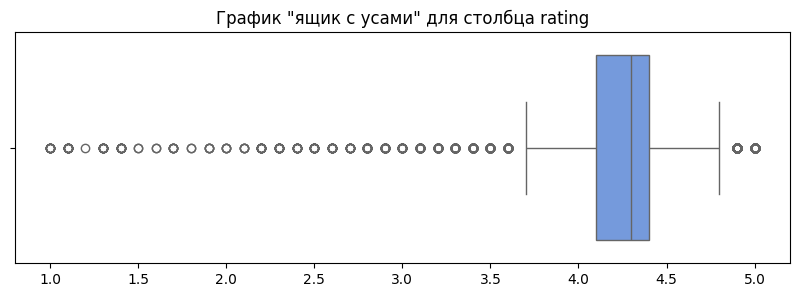

,count,mean,min,median,max,left_border,right_border,left_number,right_number
rating,8406.0,4.229895,1.0,4.3,5.0,3.65,4.85,582,348


In [26]:
outliers_stats(data, 'rating')

По графику "ящика с усами" для столбца rating видим, что 582 значения слева и 348 значения справа являются "выбросами". Все их удалить не следует, поскольку суммарно они занимают довольно большую долю от общих данных. Заметим, что данные слева от среднего по этому столбцу уходят сильно дальше, нежели данные по правую границу, в этом случае разумно будет убрать именно данные слева. Для выбора данных на удаление воспользуемся квартилями ниже.

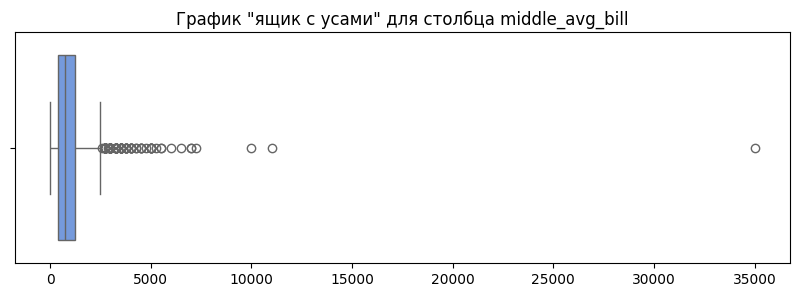

,count,mean,min,median,max,left_border,right_border,left_number,right_number
middle_avg_bill,3149.0,958.053668,0.0,750.0,35000.0,0.0,2562.5,0,104


In [27]:
outliers_stats(data, 'middle_avg_bill')

По графику "ящика с усами" для столбца middle_avg_bill видим, что 104 значения выбиваются за правую границу со значением 2562 при медианном значении 750. 

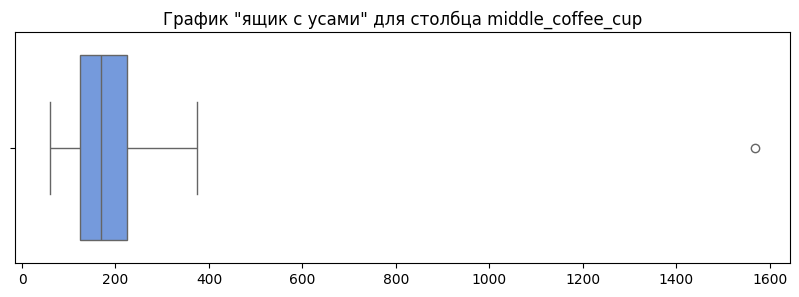

,count,mean,min,median,max,left_border,right_border,left_number,right_number
middle_coffee_cup,535.0,174.721495,60.0,169.0,1568.0,60.0,375.75,0,1


In [28]:
outliers_stats(data, 'middle_coffee_cup')

Всего одно значение можно назвать выбросом в столбце middle_coffee_cup, превышающее правую границу практически в 4 раза. Его точно нужно удалить.

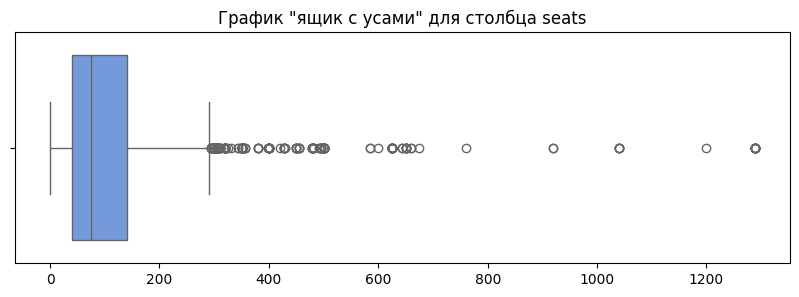

,count,mean,min,median,max,left_border,right_border,left_number,right_number
seats,4795.0,108.421689,0.0,75.0,1288.0,0.0,290.0,0,318


In [29]:
outliers_stats(data, 'seats')

Для столбца seats 318 значений выходят за правую границу. Значений довольно много, все их удалять не стоит, поскольку они занимают существенную долю от непустых значений в этом столбце 6.6%.

In [30]:
(
    data[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .quantile([0.0012, 0.01, .5, .99, .9988])
    .style.format("{:,.2f}")
)

,rating,middle_avg_bill,middle_coffee_cup,seats
0.001200,1.10,50.00,60.00,0.00
0.010000,2.30,140.00,60.00,0.00
0.500000,4.30,750.00,169.00,75.00
0.990000,5.00,"3,750.00",309.90,625.00
0.998800,5.00,"7,055.60",803.53,"1,288.00"


In [31]:
data = data.loc[data['rating']>2.3]

In [32]:
data = data.loc[(data['middle_avg_bill']<3750) | (data['middle_avg_bill'].isna())]

In [33]:
data = data.loc[(data['middle_coffee_cup']<803) | (data['middle_coffee_cup'].isna())]

In [34]:
data = data.loc[(data['seats'] < 625) | (data['seats'].isna())]

In [35]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,<NA>,<NA>,False,<NA>
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,<NA>,False,4
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,<NA>,False,45
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,False,<NA>
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,<NA>,True,148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,<NA>,<NA>,False,86
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,<NA>,<NA>,False,150
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150,<NA>,False,150
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,<NA>,<NA>,True,150


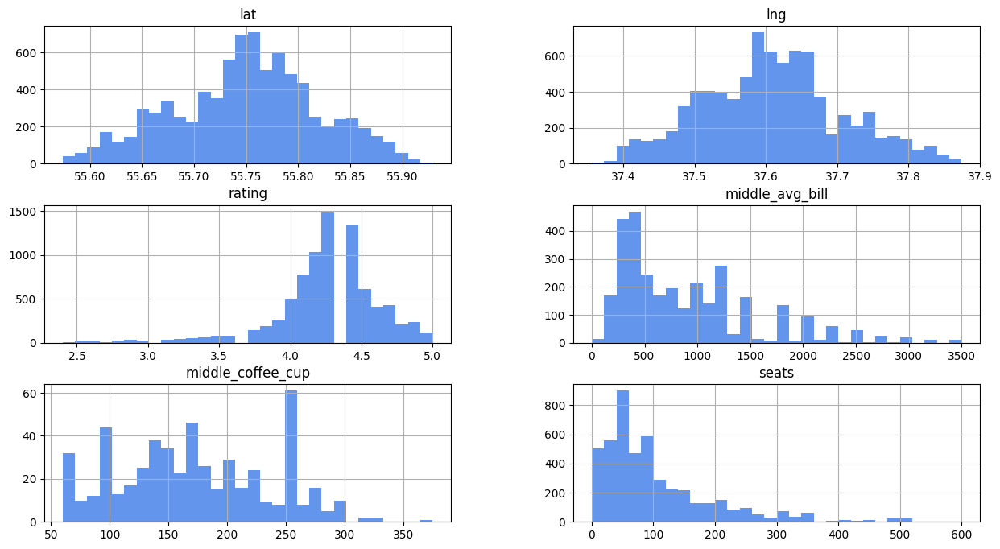

In [36]:
data.hist(bins=30, figsize=(15, 8), color='cornflowerblue');

In [37]:
print('Удалено строк:', old_len_data - len(data))
print('Процент удаленных строк относительно начальных данных', 
      round((old_len_data - len(data)) / old_len_data * 100, 1), '%')

Удалено строк: 187
Процент удаленных строк относительно начальных данных 2.2 %


После удаления выбросов в столбцах rating, middle_avg_bill, middle_coffee_cup и seats было потеряно 2.2% от общего количества данных.

### Добавление столбца с названием улицы заведения

In [38]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия','километр']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data['street'] = data['address'].str.extract(str_pat, flags=re.I)

In [39]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,<NA>,<NA>,False,<NA>,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,<NA>,False,4,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,<NA>,False,45,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,False,<NA>,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,<NA>,True,148,Правобережная улица


### Добавление столбца с обозначением, что заведение работает ежедневно и круглосуточно

In [40]:
data['is_24/7'] = False

(
    data.loc[data.hours.str.contains('(?=.*ежедневно)(?=.*круглосуточно)', 
                                     flags=re.I, na=False, regex=True), 
             'is_24/7']
) = True

In [41]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,<NA>,<NA>,False,<NA>,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,<NA>,False,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,<NA>,False,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,False,<NA>,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,<NA>,True,148,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,<NA>,<NA>,False,86,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,<NA>,<NA>,False,150,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150,<NA>,False,150,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,<NA>,<NA>,True,150,Люблинская улица,True


## Анализ данных

### Категории заведений

In [42]:
data.category.value_counts().to_frame().rename(columns={'category':'Количество заведений'})

,count
category,
кафе,2318
ресторан,1988
кофейня,1391
"бар,паб",744
пиццерия,627
быстрое питание,588
столовая,310
булочная,253


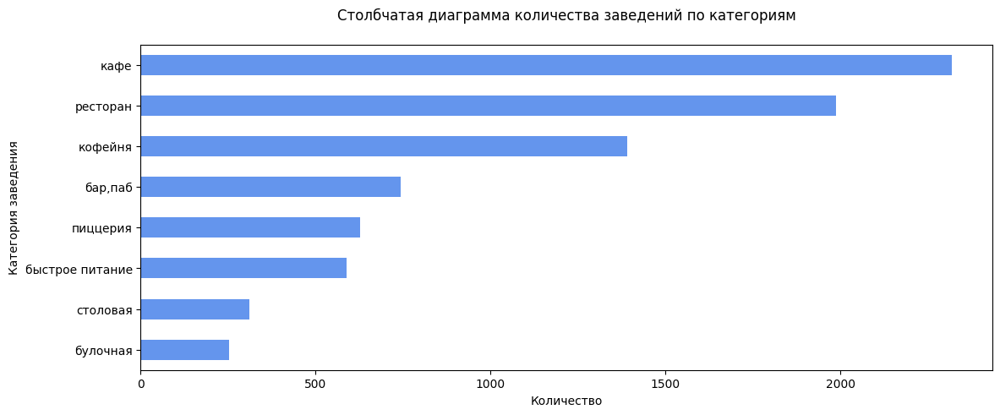

In [43]:
(
    data.category.value_counts().sort_values()
    .plot(kind='barh', figsize=(13, 5), color='cornflowerblue')
)

plt.xlabel('Количество')
plt.ylabel('Категория заведения')
plt.title('Столбчатая диаграмма количества заведений по категориям' + "\n");

In [44]:
fig = go.Figure(data=[go.Pie(labels=data.category.value_counts().index, 
                             values=data.category.value_counts(), 
                             pull=[0.07, 0, 0, 0, 0, 0, 0, 0])])
fig.update_layout(title="Круговая диаграмма количества заведений по категориям")

fig.show()

Таким образом, самые распространенные категории заведений общественного питания: кафе, ресторан, кофейня. Вместе они занимают 69.3% от общего количества заведений. Среди этих трех, самое частое место - кафе, занимающее 28.2% всех данных. Наименее популярные заведения: столовая и булочная, вместе они занимают лишь 6.85% общих данных. 

### Количество посадочных мест по категориям

In [45]:
seats_sum_by_category = (
    data
    .groupby('category')
    .agg({'seats':'sum'})
    .sort_values(by='seats', ascending=False)
    .rename(columns={'seats':'Суммарное количество мест'})
)
seats_sum_by_category

,Суммарное количество мест
category,
ресторан,140339
кафе,107392
кофейня,73907
"бар,паб",50014
пиццерия,37137
быстрое питание,33155
столовая,14314
булочная,12364


Больше всего мест среди всех категорий заведений занимают рестораны: 140339 мест. Меньше всего мест в талбице у булочных: 12364.

In [46]:
fig = px.bar(seats_sum_by_category, 
             x=seats_sum_by_category.index, 
             y='Суммарное количество мест')
fig.update_layout(title="Столбчатая диаграмма суммарного распределения посадочных мест для каждой категории",
                  xaxis_title='Категория')
fig.show()

In [47]:
fig = go.Figure(data=[go.Pie(labels=seats_sum_by_category.index, 
                             values=seats_sum_by_category['Суммарное количество мест'],
                             pull=[0.07, 0, 0, 0, 0, 0, 0, 0])])
fig.update_layout(title="Круговая диаграмма суммарного распределения посадочных мест для каждой категории")

fig.show()

Рестораны занимают практически 30% от общего количества всех мест, вторыми идут кафе с 23% от общего числа мест. Относительно всей таблицы, рестораны и кафе имеют более половины всех сидячих мест (247731 место). Наименьшее количество мест имеют столовые и булочные, занимая чуть менее 6% от общего числа. Эти данные были вполне ожидаемыми, поскольку из прошлых графиков было видно, что рестораны и кафе имеют больше всего заведений, в то время как столовые и булочные - меньше всего.

In [48]:
seats_mean_by_category = (
    data
    .groupby('category')
    .agg({'seats':'median'})
    .sort_values(by='seats', ascending=False)
    .rename(columns={'seats':'Медианное количество мест'})
    .round()
)
seats_mean_by_category

,Медианное количество мест
category,
ресторан,85.0
"бар,паб",80.0
кофейня,77.0
столовая,74.0
быстрое питание,69.0
кафе,60.0
пиццерия,52.0
булочная,50.0


Рестораны по прежнему занимают лидирующее положение по количеству мест, однако уже по медианному количеству мест. Булочные остались на последнем месте.

In [49]:
fig = px.bar(seats_mean_by_category, 
             x=seats_mean_by_category.index, 
             y='Медианное количество мест')
fig.update_layout(title="Столбчатая диаграмма медианного распределения посадочных мест для каждой категории",
                  xaxis_title='Категория')
fig.show()

In [50]:
fig = go.Figure(data=[go.Pie(labels=seats_mean_by_category.index, 
                             values=seats_mean_by_category['Медианное количество мест'],
                             pull=[0.07, 0, 0, 0, 0, 0, 0, 0])])
fig.update_layout(title="Круговая диаграмма медианного распределения посадочных мест для каждой категории")

fig.show()

Рассматривая медианные показатели сидячих мест по заведениям, результаты сильно изменились. Убрав фактор суммарного количества заведений, уже не наблюдается такой огромной разницы между, например, ресторанами и булочными. Первое и последнее место, однако, сохранилось, рестораны лидируют со средним показателем в 85 мест, в то время как булочные показывают самый низкий результат: 50 мест. Интересно, что в суммарных данных, кафе занимали второе место или 23% от общих данных. Рассматривая средние показатели, кафе ушли на 6-е место с медианным количеством мест - 60. На место кафе встали бары/пабы с очень близким к ресторанам медианным показателем, равным 80.

### Соотношение сетевых и несетевых заведений

In [51]:
data.groupby('chain').agg({'name':'count'}).rename(columns={'name':'Количество заведений'})

,Количество заведений
chain,
False,5079
True,3140


In [52]:
colors = ['tomato', 'royalblue']
fig = go.Figure(data=[go.Pie(labels=['Несетевое заведение', 'Сетевое заведение'], 
                             values=data.groupby('chain').agg({'name':'count'})['name'],
                             marker_colors=colors)])
fig.update_layout(title="Круговая диаграмма сетевых и несетевых заведений")


fig.show()

По графику видно, что количество несетевых заведений довольно сильно превышает количество сетевых: 62% на 38%.

### Соотношение сетевых и несетевых заведений по категориям

In [53]:
chain_nonchain_category = (
    data.groupby(['category', 'chain'])
    .agg({'name':'count'})
    .reset_index()
    .sort_values(by='name')
)

fig = px.bar(chain_nonchain_category, x='category', y='name', color='chain', barmode='group')

fig.update_layout(title="Столбчатая диаграмма сетевых/несетевых заведений по категориям",
                  xaxis_title='Категория',
                  yaxis_title='Количество заведений',
                  legend_title='Сетевое')
fig.show()

Из графика видно, что булочные, пиццерии и кофейни чаще являются сетевыми, остальные категории чаще оказываются несетевыми. 

In [54]:
chain_nonchain_category_pie = chain_nonchain_category.loc[chain_nonchain_category['category'].isin(['булочная', 'пиццерия', 'кофейня'])]

fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Булочная', 'Пиццерия', 'Кофейня'])

fig.add_trace(go.Pie(labels=['Несетевое заведение', 'Сетевое заведение'], 
                     values=chain_nonchain_category_pie.loc[chain_nonchain_category_pie['category']=='булочная', 'name'], 
                     name="Булочная"),
              1, 1)
fig.add_trace(go.Pie(labels=['Несетевое заведение', 'Сетевое заведение'], 
                     values=chain_nonchain_category_pie.loc[chain_nonchain_category_pie['category']=='пиццерия', 'name'], 
                     name="Пиццерия"),
              1, 2)
fig.add_trace(go.Pie(labels=['Несетевое заведение', 'Сетевое заведение'], 
                     values=chain_nonchain_category_pie.loc[chain_nonchain_category_pie['category']=='кофейня', 'name'], 
                     name="Кофейня"),
              1, 3)

fig.update_layout(title_text="Категории заведений, в которых сетевые встречаются чаще")

fig.show()

Среди трех категорий, в которых чаще встречаются сетевые заведения, нежели несетевые, булочная занимает лидирующее место, с 61% сетевых мест. Для пиццерий и кофеен разница между сетевыми и несетевыми заведениями близка к нулю.

### Топ-15 популярных сетей в Москве

In [55]:
top15_chains = (
    data
    .loc[data['chain'] == True]
    .groupby('name')
    .agg({'category':pd.Series.mode, 'price':pd.Series.mode, 
          'middle_avg_bill':'mean', 'middle_coffee_cup':'mean', 
          'seats':'mean', 'lat':'count'})
    .round()
    .sort_values(by='lat', ascending=False)
    .rename(columns={'lat':'places_count'})
    .head(15)
)
top15_chains

,category,price,middle_avg_bill,middle_coffee_cup,seats,places_count
name,,,,,,
Шоколадница,кофейня,средние,679.0,256.0,118.0,117
Домино'с Пицца,пиццерия,средние,504.0,<NA>,53.0,76
Додо Пицца,пиццерия,средние,388.0,<NA>,95.0,74
One Price Coffee,кофейня,средние,<NA>,95.0,117.0,69
Яндекс Лавка,ресторан,[],<NA>,<NA>,87.0,67
Cofix,кофейня,низкие,<NA>,69.0,106.0,64
Prime,ресторан,средние,362.0,<NA>,127.0,50
Хинкальная,кафе,средние,1005.0,<NA>,81.0,44
КОФЕПОРТ,кофейня,низкие,<NA>,96.0,123.0,41


In [56]:
fig = px.bar(top15_chains, 
             x=top15_chains.index, 
             y='places_count',
             color='category')
fig.update_layout(title="Диаграмма количества заведений для ТОП-15 сетей Москвы в разбивке по категориям",
                  xaxis_title='Название сети',
                  yaxis_title='Количество точек в сети',
                  legend_title='Категория')
fig.show()

На графике видно, что самая популярная сеть в Москве - Шоколадница, имеющая 117 заведений в своей сети. Шоколадница сильно превышает по количеству заведений остальные сети. Второй сетью выступает Домино'с пицца с 76 заведениями. На 15-м месте расположилось кафе Му-Му, в сеть которой выходит 27 заведений.

Заметим, что среди ТОПа-15 сетей, наиболее частой категорией является кофейня (5 из 15 сетей), за ней идет кафе (4 из 15), ресторан (3 из 15), пиццерия (2 из 15) и самой редкой категорией в ТОПе-15 оказывается булочная с одной сетью.

In [57]:
(
    top15_chains.price
    .value_counts()
    .to_frame()
    .rename(columns={'price':'Количество заведений определенной ценовой категории'})
)

,count
price,
средние,12
низкие,2
[],1


Заметим, что все сетевые заведения из ТОПа-15 занимают среднюю или низкую ценовую категорию с преобладанием именно средне-ценового сегмента (80%). У заведения "Яндекс Лавка" ценовая категория не известна ни для одной из их точек.

Яндекс Лавка является сетью "дарксторов", предназначенных для быстрой доставки продуктов и готовой еды (10-15 минут). Средний чек в этой сети заведений составляет 870 рублей на 2021 год. Исходя из этой информации, можем отнести ценовую категорию Яндекс Лавки к средней.

Таким образом, для ТОПа-15 сетей Москвы нет ни одной сети с ценовой категорией выше средней.

### Количество заведений в различных административных районах Москвы

In [58]:
data.district.value_counts().to_frame().sort_values(by='count').rename(columns={'count':'Количество заведений в округе'})

,Количество заведений в округе
district,
Северо-Западный административный округ,403
Юго-Восточный административный округ,691
Юго-Западный административный округ,695
Восточный административный округ,780
Западный административный округ,813
Северный административный округ,866
Северо-Восточный административный округ,872
Южный административный округ,882
Центральный административный округ,2217


In [59]:
distr_sum = (
    data.district
    .value_counts()
    .to_frame()
    .sort_values(by='count')
    .rename(columns={'count':'Количество заведений в округе'})
)
distr_sum.sort_values(by='Количество заведений в округе', ascending=False)

,Количество заведений в округе
district,
Центральный административный округ,2217
Южный административный округ,882
Северо-Восточный административный округ,872
Северный административный округ,866
Западный административный округ,813
Восточный административный округ,780
Юго-Западный административный округ,695
Юго-Восточный административный округ,691
Северо-Западный административный округ,403


In [60]:
fig = px.bar(distr_sum, 
             x='Количество заведений в округе', 
             y=distr_sum.index,
             orientation='h')
fig.update_layout(title="Столбчатая диаграмма количества заведений по административным районам Москвы",
                  yaxis_title='Округ')
fig.show()

In [61]:
fig = go.Figure(data=[go.Pie(labels=distr_sum.index, 
                             values=distr_sum['Количество заведений в округе'],
                             pull=[0, 0, 0, 0, 0, 0, 0, 0, 0.07])])
fig.update_layout(title="Круговая диаграмма количества заведений по административным районам Москвы")

fig.show()

In [62]:
distr_category_sum = (
    data
    .groupby(['district', 'category'])
    .agg({'name':'count'})
    .rename(columns={'name':'Количество заведений'})
    .reindex(labels=distr_sum.sort_values(by='Количество заведений в округе').index,
             level=0)
    .reset_index()
)

fig = px.bar(distr_category_sum, 
             x='Количество заведений', 
             y='district',
             color='category',
             orientation='h')
fig.update_layout(title="Столбчатая диаграмма количества заведений по округам в разбивке по категориям",
                  yaxis_title='Округ', 
                  legend_title='Категория',
                  barmode='stack')
fig.show()

Из графиков видим, больше всего заведений находится в ЦАО (27% общего числа заведений), меньше всего в СЗАО (5% от общего числа). В ЦАО наиболее распространенная категория - рестораны, что не удивительно для центра. Во всех остальных округах наиболее распространенная категория - кафе. 

Заметим также, что бары и пабы в ЦАО занимают бОльший процент, нежели в других регионах.

### Распределение средних рейтингов по категориям заведений

In [63]:
rating_by_category = data.groupby('category').agg({'rating':'mean'}).round(2).reset_index().sort_values(by='rating')

fig = px.bar(rating_by_category, 
             x='rating', 
             y='category',
             orientation='h')
fig.update_layout(title="Диаграмма среднего рейтинга заведений по категориям",
                  yaxis_title='Категория',
                  xaxis_title='Средний рейтинг')
fig.update_xaxes(range=[4, 4.5])
fig.show()

Самый высокий усредненный рейтинг принадлежит барам и пабам, в то время как самый низкий рейтинг имеют заведения быстрого питания. Разница, однако, между первой категорией в рейтинге и последней не велика: 0.3 из 5-ти.

### Фоновая картограмма для средних рейтингов заведений в каждом районе

In [64]:
# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = '/Users/artemrybalko/Study/Analytics_Yandex/datasets/admin_level_geomap.geojson'
except:
    state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [65]:
disrt_by_rating = data.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values(by='rating', ascending=False)
disrt_by_rating

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.26
4,Северо-Западный административный округ,4.24
1,Западный административный округ,4.22
7,Юго-Западный административный округ,4.22
8,Южный административный округ,4.21
0,Восточный административный округ,4.20
3,Северо-Восточный административный округ,4.20
6,Юго-Восточный административный округ,4.18


In [66]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=disrt_by_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Заведения с самым высоким средним рейтингом находятся в ЦАО. Интересно, что в западной части Москвы средний рейтинг общепитов выше, чем в восточной.

### Все заведения датасета на карте

In [67]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

###  ТОП-15 улиц по количеству заведений

In [68]:
top15_streets = (
    data
    .groupby('street')
    .agg({'name':'count'})
    .reset_index()
    .rename(columns={'name':'Количество заведений'})
    .sort_values(by='Количество заведений', ascending=False)
    .head(15)
)
top15_streets

,street,Количество заведений
1034,проспект Мира,181
762,Профсоюзная улица,120
521,Ленинский проспект,105
1031,проспект Вернадского,96
373,Дмитровское шоссе,85
305,Варшавское шоссе,75
454,Каширское шоссе,74
519,Ленинградский проспект,71
520,Ленинградское шоссе,66
540,Люблинская улица,58


In [69]:
top15_streets_by_category = (
    data.loc[data['street'].isin(top15_streets.street)]
    .groupby(['street', 'category'])
    .agg({'name':'count'})
    .rename(columns={'name':'Количество заведений'})
    .reindex(labels=top15_streets.sort_values(by='Количество заведений')['street'],
             level=0)
    .reset_index()
)

fig = px.bar(top15_streets_by_category, 
             x='Количество заведений', 
             y='street',
             color='category',
             orientation='h')
fig.update_layout(title="Столбчатая диаграмма количества заведений в ТОП-15 улиц в разбивке по категориям",
                  yaxis_title='Улица', 
                  legend_title='Категория',
                  barmode='stack')
fig.show()

Самая насыщенная заведениями улица - проспект Мира, имеющая 181 заведение. Второй идет Профсоюзная улица со 120 заведениями, и третьей, Ленинский проспект, содержащий 105 заведений. Для первых двух улиц, преобладающей категорией заведений является кафе, они на проспекте Мира и Профсоюзной улице занимают 29% и 28% соответственно. На Ленинском проспекте же, преобладают рестораны, занимая 30%. Причем преобладание ресторанов сохраняется практически для всех остальных улиц из ТОПа-15, за исключением Каширского шоссе, Люблинской улицы, улицы Вавилова и Миклухо-Маклая. У них преобладают, также как и для первых двух улиц, кафе.

In [70]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.loc[data['street'].isin(top15_streets.street)].apply(create_marker, axis=1)
    
Choropleth(
    geo_data=state_geo,
    data=disrt_by_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Заметим также, что среди ТОПа-15 улиц по насыщенности заведениями, ни одна не проходит через ВАО или СЗАО.

### Улицы, на которых находится только один объект общепита

In [71]:
one_place_streets = (
    data
    .groupby('street')
    .agg({'category':'first', 'rating':'first', 
          'price':'first', 'is_24/7':'first', 
          'seats':'first' ,'name':'count'})
    .reset_index()
    .sort_values(by='name')
    .query('name == 1')
    .rename(columns={'name':'Количество заведений'})
)
one_place_streets

,street,category,rating,price,is_24/7,seats,Количество заведений
0,1-й Автозаводский проезд,кафе,4.2,средние,True,20,1
885,Сытинский переулок,ресторан,4.5,средние,False,<NA>,1
886,Сытинский тупик,"бар,паб",4.7,None,False,<NA>,1
891,Талдомская улица,"бар,паб",4.3,выше среднего,False,105,1
349,Глубокий переулок,"бар,паб",4.4,средние,False,58,1
...,...,...,...,...,...,...,...
1201,улица Крылатская,булочная,4.2,None,False,<NA>,1
1378,улица Чистова,кафе,4.5,None,False,<NA>,1
186,Андреевская набережная,столовая,4.1,None,False,<NA>,1
192,Архангельский переулок,кафе,5.0,None,False,<NA>,1


In [72]:
ops_category_perc = (one_place_streets.category.value_counts() / one_place_streets.category.value_counts().sum() * 100).round(1)
data_category_perc = (data.category.value_counts() / data.category.value_counts().sum() * 100).round(1)

In [73]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=ops_category_perc.index,
    y=ops_category_perc,
    name='Улицы с одним заведением',
    marker_color='mediumblue'
))
fig.add_trace(go.Bar(
    x=data_category_perc.index,
    y=data_category_perc,
    name='Общие данные',
    marker_color='cadetblue'
))

fig.update_layout(title_text="Категории заведений для улиц с одним общепитом и для всех улиц",
                  xaxis_title='Категория',
                  yaxis_title='Процент от общего числа заведений')

fig.show()

In [74]:
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Улицы с одним общепитом', 'Все данные'])

fig.add_trace(go.Pie(labels=one_place_streets.category.value_counts().index, 
                     values=one_place_streets.category.value_counts(), 
                     name="Улицы с одним общепитом"),
              1, 1)
fig.add_trace(go.Pie(labels=data.category.value_counts().index, 
                     values=data.category.value_counts(), 
                     name="Все данные"),
              1, 2)

fig.update_layout(title_text="Категории заведений для улиц с одним общепитом и для всех улиц")

fig.show()

Для улиц с одним заведением, процент кафе оказывается выше, нежели, чем для общих данных: 34% к 28%. Ресторанов на 4% меньше, а столовых в два раза больше: 8.5% к 3.8%. Помимо сильного изменения в процентном содержании столовых, видна разница и в пиццериях: здесь на улицах с одним заведением они занимают 3.3%, а в общих данных пиццерии занимают 7.6%.

In [75]:
fig = px.histogram(one_place_streets, x="rating", color_discrete_sequence=['mediumblue'])
fig.update_layout(title="Гистограмма распределения рейтинга для улиц с одним общепитом",
                  xaxis_title='Рейтинг',
                  yaxis_title='Количество заведений')
fig.show()

In [76]:
fig = px.histogram(data, x="rating", color_discrete_sequence=['cadetblue'])
fig.update_layout(title="Гистограмма распределения рейтинга для всех данных",
                  xaxis_title='Рейтинг',
                  yaxis_title='Количество заведений')
fig.show()

Рейтинг заведений на улицах с одним общепитом от общего распределения рейтинга не отличается. Наиболее частая средняя оценка - 4.3.

In [77]:
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Улицы с одним общепитом', 'Все данные'])

fig.add_trace(go.Pie(labels=one_place_streets.price.value_counts().index, 
                     values=one_place_streets.price.value_counts(), 
                     name="Улицы с одним общепитом"),
              1, 1)
fig.add_trace(go.Pie(labels=data.price.value_counts().index, 
                     values=data.price.value_counts(), 
                     name="Все данные"),
              1, 2)

fig.update_layout(title_text="Ценовые категории для улиц с одним заведением и для всех улиц")

fig.show()

Для улиц с одним общепитом, также, как и для всех данных, средняя ценовая категория занимает лидирующее место. Процентные содержания каждой ценовой категории для выбранных улиц почти не отличаются.

In [78]:
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Улицы с одним общепитом', 'Все данные'])

fig.add_trace(go.Pie(labels=one_place_streets['is_24/7'].value_counts().index, 
                     values=one_place_streets['is_24/7'].value_counts(), 
                     name="Улицы с одним общепитом"),
              1, 1)
fig.add_trace(go.Pie(labels=data['is_24/7'].value_counts().index, 
                     values=data['is_24/7'].value_counts(), 
                     name="Все данные"),
              1, 2)

fig.update_layout(title_text="Работает ли заведение 24/7")

fig.show()

Разницы в работе заведений 24/7 между улиц с одним общепитом и всеми данными нет. Соотношение почти одинаковое.

In [79]:
fig = px.histogram(one_place_streets.seats.fillna(np.nan).replace([np.nan], [None]), x="seats", color_discrete_sequence=['mediumblue'])
fig.update_layout(title="Гистограмма распределения количества мест для улиц с одним общепитом",
                  xaxis_title='Количество мест',
                  yaxis_title='Количество заведений')
fig.show()

In [80]:
fig = px.histogram(data.fillna(np.nan).replace([np.nan], [None]), x="seats", color_discrete_sequence=['cadetblue'])
fig.update_layout(title="Гистограмма распределения количества мест для всех данных",
                  xaxis_title='Количество мест',
                  yaxis_title='Количество заведений')
fig.show()

Количество мест в заведениях на улицах с одним общепитом от общего распределения мест не отличается. Наиболее часто встречаемое значение - 40-49 мест.

In [81]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
data.loc[data['street'].isin(one_place_streets.street)].apply(create_marker, axis=1)
    
Choropleth(
    geo_data=state_geo,
    data=disrt_by_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.4,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Все заведения, с рассматриваемых нами улиц, разбросаны по всей карте Москвы. Какой-то связи с регионом не найдено.

### Фоновая картограмма для средних чеков в каждом районе

In [82]:
distr_bill = (
    data
    .groupby('district', as_index=False)
    .agg({'middle_avg_bill':'median'})
    .sort_values(by='middle_avg_bill', ascending=False)
)
distr_bill

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,900.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [83]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distr_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний чек достигается в ЦАО (1000р), самые низкие в ЮВАО (450р), ЮАО (500р) и СВАО (500р). Вторым регионом по высоте среднего чека является ЗАО (900р). По карте видно, что в западной части Москвы медианный средний чек выше, нежели чем в восточной части.

In [84]:
# Добавляем столбец с показателем расстояния заведения до центра
data['center_dist'] = np.sqrt((moscow_lat - data['lat'])**2 + (moscow_lng - data['lng'])**2)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,center_dist
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,<NA>,<NA>,False,<NA>,улица Дыбенко,False,0.188866
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,<NA>,False,4,улица Дыбенко,False,0.182908
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,<NA>,False,45,Клязьминская улица,False,0.166064
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,False,<NA>,улица Маршала Федоренко,False,0.183797
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,<NA>,True,148,Правобережная улица,False,0.213221


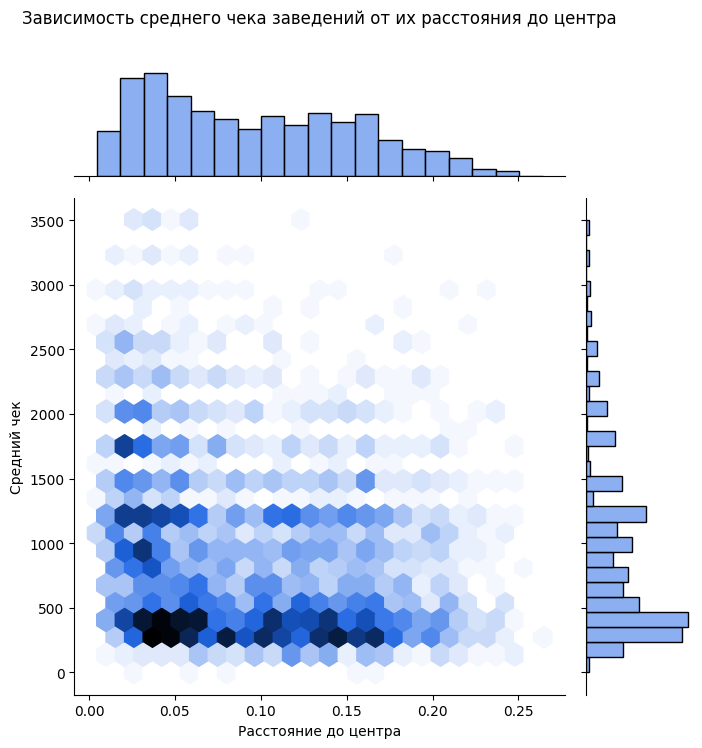

In [85]:
sns.jointplot(x="center_dist", y="middle_avg_bill", data=data, 
              kind="hex", height=7, ratio=4, color='cornflowerblue')

plt.xlabel('Расстояние до центра')
plt.ylabel('Средний чек')
plt.title('Зависимость среднего чека заведений от их расстояния до центра' + "\n"*8);

Прямой линейной зависимости между средним чеком и расстоянием до центра не наблюдается, однако из графика видно, что если низкий средний чек плотно распределен как для близких к центру общепитов, так и для далеких от него, то высокий средний чек больше сосредоточен именно для заведений, близких к центру.

### Общий вывод по анализу данных

1. В данных представлено 8 различных категорий заведений: кафе, ресторан, кофейня, пиццерия, бар/паб, быстрое питание, булочная и столовая. Из них самые распространенные: кафе, ресторан, кофейня. Вместе они занимают 69.3% от общего количества заведений. Среди этих трех, самое частое место - кафе, занимающее 28.2% всех данных. Наименее популярные заведения: столовая и булочная, вместо они занимают лишь 6.85% общих данных.
2. Рестораны занимают практически 30% от общего количества всех мест, вторыми идут кафе с 23% от общего числа мест. Относительно всей таблицы, рестораны и кафе имеют более половины всех сидячих мест (247731 место). Наименьшее количество мест имеют столовые и булочные, занимая чуть менее 6% от общего числа. 
3. Рассматривая медианные показатели сидячих мест по заведениям, результаты меняются. Рестораны все еще лидируют со средним показателем в 85 мест, в то время как булочные показывают самый низкий результат: 50 мест. Кафе ушли на 6-е место со средним количеством мест - 60. На место кафе встали бары/пабы с близким к ресторанам средним показателем, равным 80.
4. Количество несетевых заведений довольно сильно превышает количество сетевых: 62% на 38%. Булочные, пиццерии и кофейни чаще являются сетевыми, остальные категории чаще оказываются несетевыми. 
5. Самая популярная сеть в Москве - Шоколадница, имеющая 117 заведений в своей сети. Шоколадница сильно превышает по количеству заведений остальные сети. Второй сетью выступает Домино'с пицца с 76 заведениями. На 15-м месте расположилось кафе Му-Му, в сеть которой выходит 27 заведений. Среди ТОПа-15 сетей по количеству заведений, наиболее частой категорией является кофейня, а самой редкой - булочная.
6. Все сетевые заведения из ТОПа-15 занимают среднюю или низкую ценовую категорию с преобладанием именно средне-ценового сегмента. Ни одна из сетей не имеет цены выше средних.
7. Больше всего заведений находится в ЦАО (27% общего числа заведений), меньше всего в СЗАО (5% от общего числа). В ЦАО наиболее распространенная категория - рестораны. Во всех остальных округах наиболее распространенная категория - кафе. Бары и пабы в ЦАО занимают бОльший процент, нежели в других регионах.
8. Самый высокий усредненный рейтинг принадлежит барам и пабам, в то время как самый низкий рейтинг имеют заведения быстрого питания. Разница, однако, между первой категорией в рейтинге и последней не велика: 0.3 из 5-ти. Заведения с самым высоким средним рейтингом находятся в ЦАО. В западной части Москвы средний рейтинг общепитов выше, чем в восточной.
9. Самая насыщенная заведениями улица - проспект Мира, имеющая 181 заведение. Второй идет Профсоюзная улица со 120 заведениями, и третьей, Ленинский проспект, содержащий 105 заведений. Для первых двух улиц, преобладающей категорией заведений является кафе, они на проспекте Мира и Профсоюзной улице занимают 29% и 28% соответственно. На Ленинском проспекте же, преобладают рестораны, занимая 30%. Причем преобладание ресторанов сохраняется практически для всех остальных улиц из ТОПа-15 по количеству общепитов, за исключением Каширского шоссе, Люблинской улицы, улицы Вавилова и Миклухо-Маклая. У них преобладают, также как и для первых двух улиц, кафе. Среди ТОПа-15 улиц, ни одна не проходит через ВАО или СЗАО.
10. Для улиц с одним заведением, процент кафе оказывается выше, нежели, чем для общих данных: 34% к 28%. Ресторанов на 4% меньше, а столовых в два раза больше: 8.5% к 3.8%. Помимо сильного изменения в процентном содержании столовых, видна разница и в пиццериях: здесь на улицах с одним заведением они занимают 3.3%, а в общих данных пиццерии занимают 7.6%.
11. Самый высокий средний чек достигается в ЦАО (1000р), самые низкие в ЮВАО (450р), ЮАО (500р) и СВАО (500р). Вторым регионом по высоте среднего чека является ЗАО (900р). В западной части Москвы медианный средний чек выше, нежели чем в восточной части.
12. Низкий средний чек плотно распределен как для близких к центру заведений, так и для далеких от него. Высокий же средний чек больше сосредоточен именно для заведений, близких к центру.

## Открытие кофейни

In [86]:
coffee_shops = data.loc[data['category']=='кофейня']
coffee_shops.name.count()

1391

Всего в датасете находится 1391 кофейня.

In [87]:
coffee_shops.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,center_dist
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,False,<NA>,улица Маршала Федоренко,False,0.183797
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,<NA>,<NA>,True,<NA>,NaN,False,0.203153
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,<NA>,<NA>,True,46,Коровинское шоссе,False,0.170706
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,<NA>,<NA>,True,<NA>,улица Маршала Федоренко,False,0.180034
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,<NA>,<NA>,True,<NA>,улица Дыбенко,False,0.188496


In [88]:
coffee_shops_by_distr = (
    coffee_shops
    .groupby('district', as_index=False)
    .agg({'name':'count', 'rating':'mean', 
          'middle_coffee_cup':'median', 'is_24/7':'sum'})
    .sort_values(by='name', ascending=False)
    .rename(columns={'name':'Количество кофеен'})
    .round(2)
)
coffee_shops_by_distr

,district,Количество кофеен,rating,middle_coffee_cup,is_24/7
5,Центральный административный округ,427,4.34,190.0,26
2,Северный административный округ,183,4.33,159.0,5
3,Северо-Восточный административный округ,158,4.23,162.5,3
1,Западный административный округ,145,4.21,187.0,9
8,Южный административный округ,130,4.25,152.5,1
0,Восточный административный округ,103,4.29,135.0,5
7,Юго-Западный административный округ,96,4.28,198.0,7
6,Юго-Восточный административный округ,88,4.25,147.5,0
4,Северо-Западный административный округ,61,4.36,169.5,2


In [89]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_shops_by_distr,
    columns=['district', 'Количество кофеен'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m)

# выводим карту
m

Больше всего кофеен расположено в ЦАО: 427 штук. Меньше всего в СЗАО: 61 кофейня.

In [90]:
round(coffee_shops.rating.mean(), 1)

4.3

Средний рейтинг кофейни в Москве составляет 4.3

In [91]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_shops_by_distr,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

В СЗАО кофейни имеют наивысший средний рейтинг - 4.36, сразу после этого региона идет ЦАО со средним рейтингом, равным 4.34 и САО с рейтингом = 4.33. Самые низкие оценки ставят кофейням в ЗАО, там средний рейтинг достигает 4.21.

In [92]:
coffee_shops.middle_coffee_cup.median()

170.0

Медианная стоимость чашки кофе в Москве - 170р.

In [93]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_shops_by_distr,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе по районам',
).add_to(m)

# выводим карту
m

Самая дорогая чашка кофе выходит для ЮЗАО и ЦАО: 198р и 190р соответственно. Дешевле всего кофе продают в ВАО, там чашка кофе в среднем обходится всего в 135р.

In [94]:
coffee_shops['is_24/7'].sum()

58

Всего в датасете 58 кофеен, которые работают круглосуточно.

In [95]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_shops_by_distr,
    columns=['district', 'is_24/7'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Количество кофеен, работающих 24/7 по районам',
).add_to(m)

# выводим карту
m

В основном, кофейни работают круглосуточно в ЦАО (практически 50% от всех кофеен 24/7). Количество круглосуточных кофеен в остальных регионах не превышает десяти. Есть, однако, и регион, где нет ни одной кофейни 24/7 - ЮВАО.

### Рекомендации по открытию кофейни

Для выбора локации новой кофейни стоит обратить внимание на следующие пункты: количество других кофеен в регионе, рейтинг конкурентов в регионе, средняя стоимость чашки кофе в регионе. Для рассмотрения, я предлагаю ЗАО и ЮЗАО.

ЗАО
1. ЗАО является четвертым регионом по количеству кофеен в Москве, то есть кофейни актуальны и востребованы, но регион не забит слишком большим числом конкурентов (как ЦАО).
2. Конкурентные кофейни в этом регионе имеют самые низкие оценки (4.21/5), относительно кофеен со всего города. С такими показателями соседей будет легче выделиться и заполучить постоянных клиентов.
3. Медианная стоимость чашки кофе в ЗАО - 187 рублей. Это отличный показатель. Дороже чашка кофе выходит только в ЮЗАО и ЦАО.

ЮЗАО
1. ЮЗАО является седьмым по количеству кофеен в Москве. Это очень хороший показатель, поскольку конкуренция в этом регионе оказывается сильно слабее, нежели чем в остальных, однако это не говорит о том, что востребованность меньше.
2. Средний рейтинг кофейни в ЮЗАО составляет 4.28/5, что немного меньше среднего рейтинга по всей Москве. Это как не плохой результат, так и не хороший.
3. Медианная стоимость чашки кофе в этом регионе является наивысшей и составляет 198р. Это наилучший показатель по всей Москве. В ЦАО, например, медианная стоимость чашки кофе составляет 190р.

Остальные регионы по суммарным показателям проигрывают выбранным двум, поэтому я рекомендую выбирать локацию для открытия новой кофейни именно в ЗАО или ЮЗАО.

Еще одним вариантом для региона, однако, может быть ЮВАО, если планируется открывать именно круглосуточную кофейню. В этом регионе нет ни одной подобной кофейни, работающей 24/7. Конкуренция в ЮВАО одна из самых наименьших, а средний рейтинг ниже средне-городского. Средняя стоимость одной чашки кофе, однако, крайне мала и составляет всего 148р. То есть по общим показателям регион не выделяется как особо перспективный, однако факт того, что кофейня будет единственной, работающей 24/7, может хорошо отыграть.

## Презентация

Ссылка на презентацию: https://disk.yandex.ru/i/oq2ZxMLD0uBqFg